# Реализация YOLO

## Импорт необходимых библиотек

In [133]:
import json
import gc
import os
import time
import math
import cv2 as cv
import PIL
from tqdm import tqdm
from PIL import Image
from PIL import ImageDraw
import random
import numpy as np
import pandas as pd
from collections import defaultdict
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pycocotools.coco import COCO
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
from torch.utils.data import Subset
import torchvision
import torchvision.transforms as transforms
from torchvision.models import VGG16_Weights
from torchvision.utils import draw_segmentation_masks
from torch.utils.data import DataLoader
from torchinfo import summary
from torch.optim.lr_scheduler import StepLR
import torch.optim as optim
from torchvision import models
# from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split

# import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.ops import nms

**Пути к данным**

In [134]:
root_dir = "coco_dataset"
train_dir = os.path.join(root_dir,"train2017")
val_dir = os.path.join(root_dir,"val2017")
test_dir = os.path.join(root_dir,"test2017")


## EDA

In [135]:
path_to_data_val = "coco_dataset/val2017"

In [136]:
path_to_data_val_img = os.path.join(path_to_data_val,"img")
path_to_data_val_img

'coco_dataset/val2017/img'

In [137]:
val_img_ids = os.listdir(path_to_data_val_img)

In [138]:
def create_eda_dataframe(annotation_dir):
    """
    Проходит по всем JSON-аннотациям в директории и создает DataFrame для EDA.
    Каждая строка в DataFrame соответствует одному объекту.
    """
    records = []
    
    annotation_files = [f for f in os.listdir(annotation_dir) if f.endswith('.json')]
    
    print(f"Найдено {len(annotation_files)} файлов аннотаций. Начинаю обработку...")
    
    for filename in tqdm(annotation_files):
        file_path = os.path.join(annotation_dir, filename)
        
        with open(file_path, 'r') as f:
            data = json.load(f)
            
        # --- Извлекаем данные на уровне изображения ---
        image_id = os.path.splitext(filename)[0]
        img_height = data['size']['height']
        img_width = data['size']['width']
        
        # Пропускаем изображения с некорректными размерами
        if img_height == 0 or img_width == 0:
            continue
            
        img_area = img_height * img_width
        aspect_ratio = img_width / img_height
        objects_list = data.get('objects', [])
        num_objects_in_image = len(objects_list)
        
        # --- Извлекаем данные для каждого объекта ---
        for obj in objects_list:
            class_title = obj.get('classTitle')
            geometry_type = obj.get('geometryType')
            
            points = obj['points']['exterior']
            if not points:
                continue

            # --- Вычисляем Bounding Box ---
            if geometry_type == 'rectangle':
                # Формат: [[xmin, ymin], [xmax, ymax]]
                xmin, ymin = points[0]
                xmax, ymax = points[1]
            elif geometry_type == 'polygon':
                # Формат: [[x1, y1], [x2, y2], ...]
                # Находим min/max по всем координатам
                points_np = np.array(points)
                xmin, ymin = points_np.min(axis=0)
                xmax, ymax = points_np.max(axis=0)
            else:
                continue

            # --- Вычисляем производные метрики ---
            bbox_width = xmax - xmin
            bbox_height = ymax - ymin
            bbox_area = bbox_width * bbox_height
            
            # Пропускаем боксы с нулевой площадью
            if bbox_area == 0:
                continue

            bbox_center_x = xmin + bbox_width / 2
            bbox_center_y = ymin + bbox_height / 2
            relative_bbox_area = bbox_area / img_area
            num_poly_points = len(points) if geometry_type == 'polygon' else 0

            # --- Собираем запись для DataFrame ---
            record = {
                'image_id': image_id,
                'image_width': img_width,
                'image_height': img_height,
                'aspect_ratio': aspect_ratio,
                'num_objects_in_image': num_objects_in_image,
                'class_title': class_title,
                'geometry_type': geometry_type,
                'bbox_xmin': xmin,
                'bbox_ymin': ymin,
                'bbox_xmax': xmax,
                'bbox_ymax': ymax,
                'bbox_width': bbox_width,
                'bbox_height': bbox_height,
                'bbox_area': bbox_area,
                'bbox_center_x': bbox_center_x,
                'bbox_center_y': bbox_center_y,
                'relative_bbox_area': relative_bbox_area,
                'num_polygon_points': num_poly_points
            }
            records.append(record)
            
    return pd.DataFrame(records)

# --- Использование ---
# Укажи путь к своей папке с аннотациями
path_to_annotations = 'coco_dataset/train2017/ann' # <-- ИЗМЕНИ НА СВОЙ ПУТЬ
df = create_eda_dataframe(path_to_annotations)

# Выводим информацию о созданном DataFrame
print("\nDataFrame для EDA успешно создан!")

df.info()

Найдено 118287 файлов аннотаций. Начинаю обработку...


100%|█████████████████████████████████| 118287/118287 [00:38<00:00, 3067.58it/s]



DataFrame для EDA успешно создан!
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2012686 entries, 0 to 2012685
Data columns (total 18 columns):
 #   Column                Dtype  
---  ------                -----  
 0   image_id              object 
 1   image_width           int64  
 2   image_height          int64  
 3   aspect_ratio          float64
 4   num_objects_in_image  int64  
 5   class_title           object 
 6   geometry_type         object 
 7   bbox_xmin             int64  
 8   bbox_ymin             int64  
 9   bbox_xmax             int64  
 10  bbox_ymax             int64  
 11  bbox_width            int64  
 12  bbox_height           int64  
 13  bbox_area             int64  
 14  bbox_center_x         float64
 15  bbox_center_y         float64
 16  relative_bbox_area    float64
 17  num_polygon_points    int64  
dtypes: float64(4), int64(11), object(3)
memory usage: 276.4+ MB


In [139]:
df.head()

,image_id,image_width,image_height,aspect_ratio,num_objects_in_image,class_title,geometry_type,bbox_xmin,bbox_ymin,bbox_xmax,bbox_ymax,bbox_width,bbox_height,bbox_area,bbox_center_x,bbox_center_y,relative_bbox_area,num_polygon_points
0,000000399249.jpg,500,373,1.340483,40,car,polygon,187,266,209,288,22,22,484,198.0,277.0,0.002595,22
1,000000399249.jpg,500,373,1.340483,40,car,rectangle,187,266,209,288,22,22,484,198.0,277.0,0.002595,0
2,000000399249.jpg,500,373,1.340483,40,car,polygon,144,272,148,274,4,2,8,146.0,273.0,0.000043,6
3,000000399249.jpg,500,373,1.340483,40,car,rectangle,144,272,148,274,4,2,8,146.0,273.0,0.000043,0
4,000000399249.jpg,500,373,1.340483,40,car,polygon,132,255,158,281,26,26,676,145.0,268.0,0.003625,9


In [140]:
df_segment = df[df["geometry_type"]=="polygon"]
df_segment

,image_id,image_width,image_height,aspect_ratio,num_objects_in_image,class_title,geometry_type,bbox_xmin,bbox_ymin,bbox_xmax,bbox_ymax,bbox_width,bbox_height,bbox_area,bbox_center_x,bbox_center_y,relative_bbox_area,num_polygon_points
0,000000399249.jpg,500,373,1.340483,40,car,polygon,187,266,209,288,22,22,484,198.0,277.0,0.002595,22
2,000000399249.jpg,500,373,1.340483,40,car,polygon,144,272,148,274,4,2,8,146.0,273.0,0.000043,6
4,000000399249.jpg,500,373,1.340483,40,car,polygon,132,255,158,281,26,26,676,145.0,268.0,0.003625,9
6,000000399249.jpg,500,373,1.340483,40,car,polygon,147,263,176,286,29,23,667,161.5,274.5,0.003576,57
8,000000399249.jpg,500,373,1.340483,40,car,polygon,437,275,464,315,27,40,1080,450.5,295.0,0.005791,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012676,000000004011.jpg,640,542,1.180812,18,cake,polygon,307,294,493,513,186,219,40734,400.0,403.5,0.117430,32
2012678,000000004011.jpg,640,542,1.180812,18,spoon,polygon,562,238,580,261,18,23,414,571.0,249.5,0.001193,11
2012680,000000004011.jpg,640,542,1.180812,18,dog,polygon,314,306,486,509,172,203,34916,400.0,407.5,0.100657,49
2012682,000000272967.jpg,640,427,1.498829,4,person,polygon,301,176,344,235,43,59,2537,322.5,205.5,0.009284,22


In [141]:
dft = df_segment.groupby(["image_id"]).size().reset_index(name="count")
dft

,image_id,count
0,000000000009.jpg,9
1,000000000025.jpg,2
2,000000000030.jpg,2
3,000000000034.jpg,1
4,000000000036.jpg,3
...,...,...
117257,000000581906.jpg,2
117258,000000581909.jpg,5
117259,000000581913.jpg,4
117260,000000581921.jpg,3


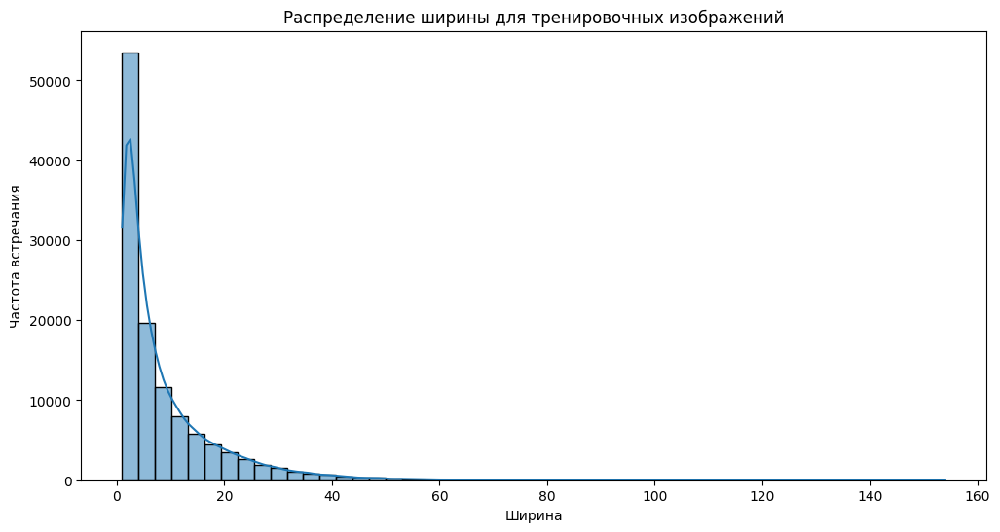

In [142]:
plt.figure(figsize=(12,6))
sns.histplot(dft["count"],bins=50,kde=True)
plt.title("Распределение ширины для тренировочных изображений")
plt.xlabel("Ширина")
plt.ylabel("Частота встречания")
plt.show()

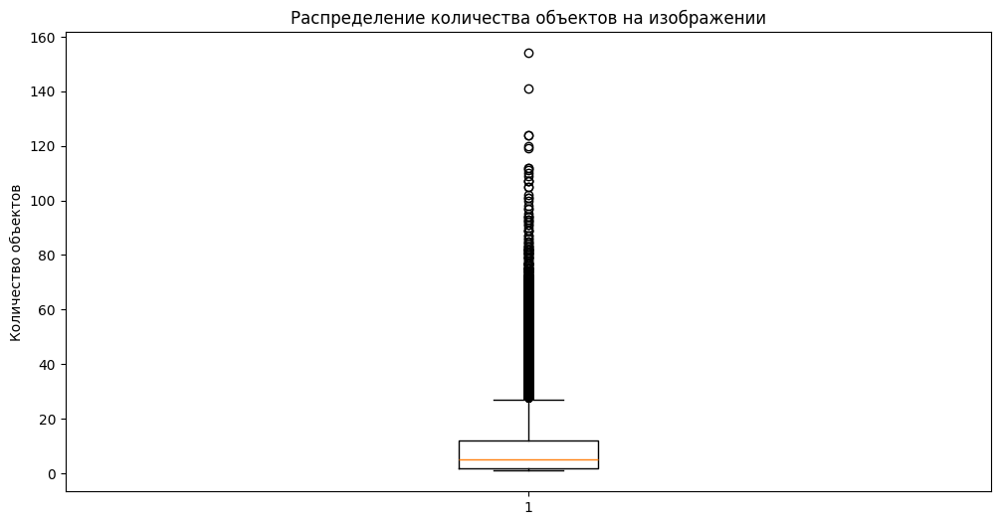

In [143]:
plt.figure(figsize=(12,6))
plt.boxplot(dft["count"])
plt.title("Распределение количества объектов на изображении")
plt.ylabel("Количество объектов")
plt.show()

Как мы видим, основная часть изображений содержит от 0 до 30 объектов, хотя существуют отдельные изображения с большими количеством объектов, которые могут достигать 154

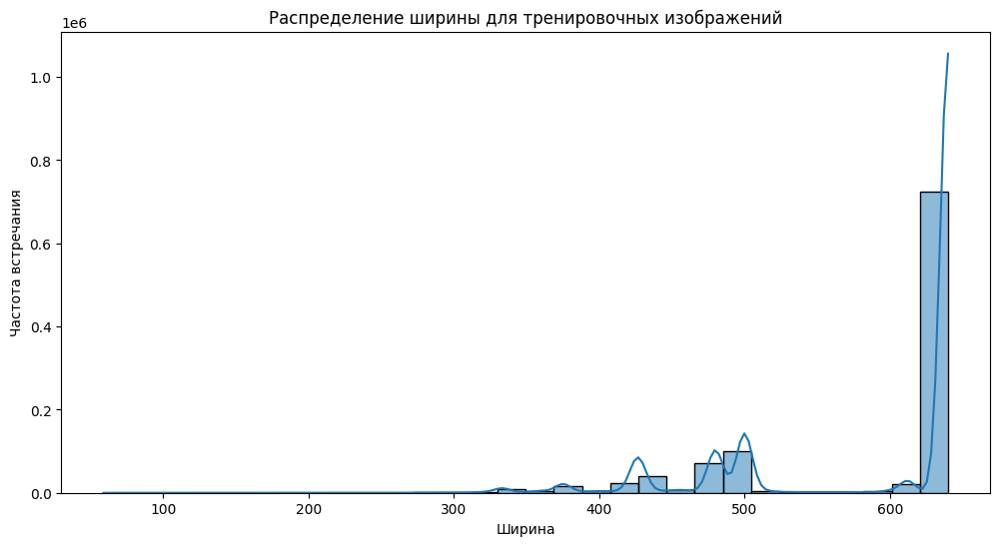

In [144]:
plt.figure(figsize=(12,6))
sns.histplot(df_segment["image_width"],bins=30,kde=True)
plt.title("Распределение ширины для тренировочных изображений")
plt.xlabel("Ширина")
plt.ylabel("Частота встречания")
plt.show()

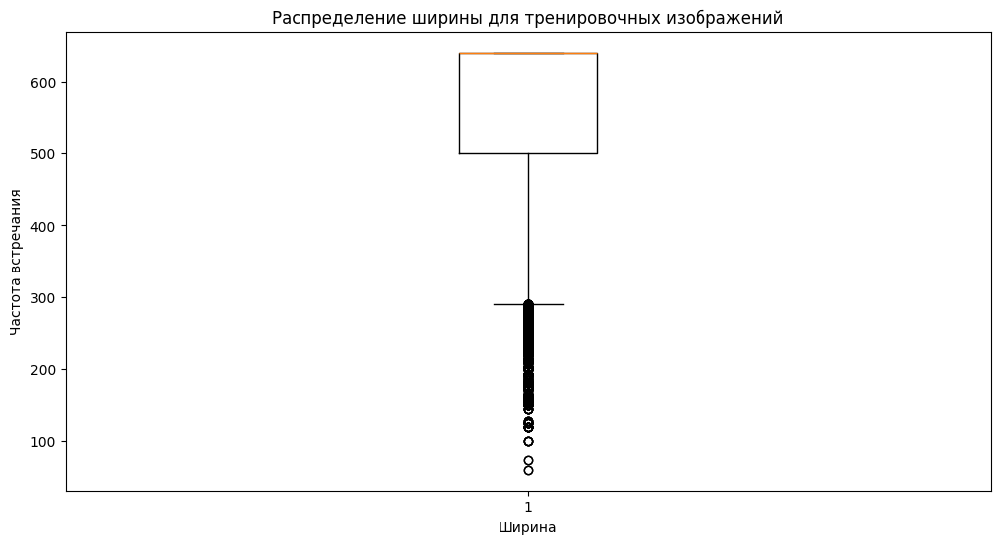

In [145]:
plt.figure(figsize=(12,6))
plt.boxplot(df_segment["image_width"])
plt.title("Распределение ширины для тренировочных изображений")
plt.xlabel("Ширина")
plt.ylabel("Частота встречания")
plt.show()

Насколько сбалансирован датасет по классам?

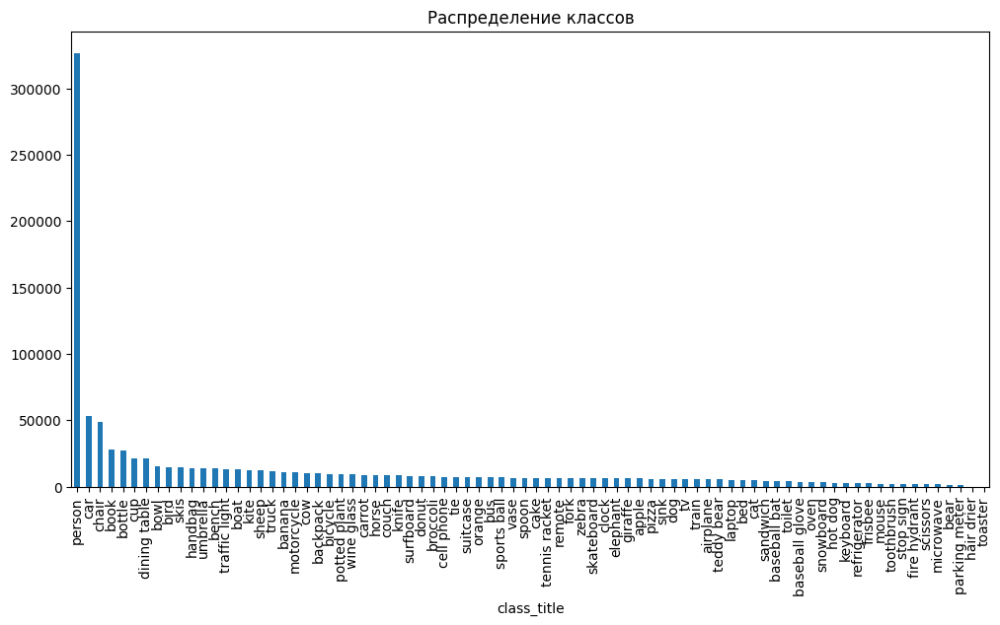

In [147]:
df_segment["class_title"].value_counts().plot(kind="bar",title="Распределение классов",figsize=(12,6), rot=90 );

In [148]:
print(f"Процент изображений на которых есть люди, по отношению \n ко всему датасету составляет: {df_segment[df_segment["class_title"]=="person"].shape[0]/df_segment.shape[0] *100 :.2f}%")

Процент изображений на которых есть люди, по отношению 
 ко всему датасету составляет: 31.54%


In [149]:
del df, df_segment
gc.collect()

15091

<h1>Архетиктура YOLO, которую мы будем реализовывать</h1>
    <img src=https://habrastorage.org/r/w1560/getpro/habr/upload_files/032/0e1/fb8/0320e1fb89026ba6c7beb691f2587f78.png alt="Пример изображения на сайте">

**В качестве Backbone будем использовать предобученный Resnet34**

In [4]:
IMAGE_HEIGHT = 448
IMAGE_WIDTH = 448
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
C = 1
B = 2
S = 7

In [5]:
yolo_config = {
    "C": C,
    "B": B,
    "S": S,
    "input_size": IMAGE_WIDTH,
    "pretrained": True
}

In [6]:
## Наша модель
class YoloV1(nn.Module):
    def __init__(self,yolo_config):
        super(YoloV1,self).__init__()
        self.num_classes = yolo_config["C"]
        self.image_size = yolo_config["input_size"]
        self.C =  yolo_config["C"]
        self.B = yolo_config["B"]
        self.S = yolo_config["S"]
        self.pretrained = yolo_config["pretrained"]

        
        if (self.pretrained == False):
            ## Если не использовать предобученый backbone (реализация, чтобы понять архитектуру)
            self.backbone = nn.Sequential(
                ## 1й Сверточный слой
                nn.Conv2d(in_channels=3,out_channels=64,kernel_size=7,padding=3,stride=2),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.1),
                nn.MaxPool2d(kernel_size=2,stride=2,padding=0),
    
                ## 2й Свертойчный слой
                nn.Conv2d(64,192,kernel_size=3,padding=1),
                nn.BatchNorm2d(192),
                nn.LeakyReLU(0.1),
                nn.MaxPool2d(2,2),
    
                #3 Слой
                nn.Conv2d(192,128,kernel_size=1),
                nn.LeakyReLU(0.1),
                nn.Conv2d(128,256,kernel_size=3,padding=1),
                nn.LeakyReLU(0.1),
                nn.Conv2d(256,256,kernel_size=1,padding=0),
                nn.LeakyReLU(0.1),
                nn.Conv2d(256,512,kernel_size=3,padding=1),
                nn.LeakyReLU(0.1),
                nn.MaxPool2d(kernel_size=2,stride=2),
    
                ##4й 
                nn.Conv2d(512,256,kernel_size=1),
                nn.LeakyReLU(0.1),
                nn.Conv2d(256,512,kernel_size=3,padding=1),
                nn.LeakyReLU(0.1),
                
                nn.Conv2d(512,256,kernel_size=1),
                nn.LeakyReLU(0.1),
                nn.Conv2d(256,512,kernel_size=3,padding=1),
                nn.LeakyReLU(0.1),
                
                nn.Conv2d(512,256,kernel_size=1),
                nn.LeakyReLU(0.1),
                nn.Conv2d(256,512,kernel_size=3,padding=1),
                nn.LeakyReLU(0.1),
                
                nn.Conv2d(512,256,kernel_size=1),
                nn.LeakyReLU(0.1),
                nn.Conv2d(256,512,kernel_size=3,padding=1),
                nn.LeakyReLU(0.1),
    
                nn.Conv2d(512,512,kernel_size=1),
                nn.LeakyReLU(0.1),
                nn.Conv2d(512,1024,kernel_size=3,padding=1),
                nn.LeakyReLU(0.1),
                nn.MaxPool2d(2,2),
    
                ## 5й слой
                nn.Conv2d(1024,512,kernel_size=1),
                nn.LeakyReLU(0.1),
                nn.Conv2d(512,1024,kernel_size=3,padding=1),
                nn.LeakyReLU(0.1),
                
                nn.Conv2d(1024,512,kernel_size=1),
                nn.LeakyReLU(0.1),
                nn.Conv2d(512,1024,kernel_size=3,padding=1),
                nn.LeakyReLU(0.1),
    
                nn.Conv2d(1024,1024,kernel_size=3,padding=1),
                nn.LeakyReLU(0.1),
                nn.Conv2d(1024,1024,kernel_size=3,padding=1,stride=2),
                nn.LeakyReLU(0.1)
                   
                
            )
        else:            
            ## мы будем использовать предобученый backbone
            
            resnet = torchvision.models.resnet34(weights='IMAGENET1K_V1')
            
            self.backbone = nn.Sequential(
                resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool,
                resnet.layer1, resnet.layer2, resnet.layer3, resnet.layer4,
                nn.Conv2d(512, 1024, 3, padding=1),
                nn.LeakyReLU(0.1),
                nn.Conv2d(1024, 1024, 3, padding=1), 
                nn.LeakyReLU(0.1),
                nn.Conv2d(1024, 1024,kernel_size=3,padding=1,stride=2),
                nn.LeakyReLU(0.1)
            ) ## ResNet34 выдает (512,7,7) и мы к нему добавляем пару слоев из оригинальной архитектуры Yolov1

        ## Detection Head
        self.detection_head = nn.Sequential(
            nn.Conv2d(1024,1024,kernel_size=3,padding=1),
            nn.LeakyReLU(0.1),

            nn.Conv2d(1024,1024,kernel_size=3,padding=1),
            nn.LeakyReLU(0.1)
        )

        ## Detection Layer
        self.fc_yolo_layer = nn.Sequential(
            nn.Conv2d(1024, 5 * self.B + self.C, 1),
        )

        ## инициализация весов
        self._initialization_weights()
        
    def _initialization_weights(self):
        """Инициализирует веса новых слоев (не обученных)"""

        ## Инициализация He, чтобы сохранить нормальное распределение и сохранить дисперсию 
        ## (Пробовал применять {Хавьер} инициализацию,но она показала себя хуже )
        for i, layer in enumerate(self.backbone):
            if i < 8:  # Первые 8 слоев - предобученный ResNet34
                continue
            if isinstance(layer, nn.Conv2d):
                torch.nn.init.kaiming_uniform_(layer.weight,mode="fan_in",nonlinearity='leaky_relu')
                if layer.bias is not None:
                    torch.nn.init.constant_(layer.bias, 0.0)

        


        for module in self.detection_head:
            if isinstance(module, nn.Conv2d):
                torch.nn.init.kaiming_uniform_(module.weight,mode="fan_in",nonlinearity='leaky_relu')
                if module.bias is not None:
                    torch.nn.init.constant_(module.bias,0.0)

        for module in self.fc_yolo_layer:
            if isinstance(module, nn.Conv2d):
                torch.nn.init.kaiming_uniform_(module.weight,mode="fan_in",nonlinearity='leaky_relu')
                if module.bias is not None:
                    torch.nn.init.constant_(module.bias,0.0)
                    

    def forward(self,x):
        x = self.backbone(x)
        x = self.detection_head(x)
        x = self.fc_yolo_layer(x) # (batch_size, B*5 + C, 7, 7)
        x = x.permute(0,2,3,1)
        return x

In [7]:
model = YoloV1(yolo_config)
model

YoloV1(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)

In [37]:
## Замораживаем веса предобученного resnet34 (они и так хорошо обучены)
for i, layer in enumerate(model.backbone.children()):
    if i < 8:  # Первые 8 слоев - предобученный ResNet34
        for param in layer.parameters():
            param.requires_grad = False

### Создаем DataSet

**основные параметры**

In [9]:

device = torch.device("cuda" if torch.cuda.is_available else "cpu")
## модель будет детектировать только один класс
## в YOLOv1 нет backgroud 
CLASS_MAP = {
    # '__background__': 0,
    'person': 1
}
NUM_CLASSES = 2
BATCH_SIZE = 32


In [10]:
## Аугментация
train_transform_yolo= A.Compose([
    A.Resize(height=IMAGE_HEIGHT, width=IMAGE_WIDTH),  # Простое изменение размера
    A.HorizontalFlip(p=0.5),
    A.Affine(
        translate_percent=(-0.05, 0.05),
        scale=(0.9, 1.1),  
        rotate=(-5, 5),
        p=0.5
    ),
    A.RandomBrightnessContrast(
        brightness_limit=(-0.2, 0.3),
        contrast_limit=(-0.1, 0.1),
        p=0.5
    ),
    A.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD,
        max_pixel_value=255.0,
    ),
    ToTensorV2(),
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

In [11]:
# Пайплайн для ВАЛИДАЦИОННОЙ выборки (БЕЗ случайных аугментаций)
val_transform = A.Compose([
    A.Resize(height=IMAGE_HEIGHT, width=IMAGE_WIDTH),
    A.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD,
        max_pixel_value=255.0,
    ),
    ToTensorV2(),
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

In [12]:
## Класс датасета
class CocoDataset(data.Dataset):
    
    def __init__(self, root_dir, class_map,im_size=448, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.class_map = class_map
        self.image_size = im_size
        self.img_dir = os.path.join(self.root_dir, "img")
        self.ann_path = os.path.join(self.root_dir, "ann") 
        self.S = S
        self.B = B
        self.C = C
        
        
        self.image_ids = [f for f in os.listdir(self.img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
        
    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        # Предохранитель от бесконечного цикла, если валидных данных мало
        for _ in range(len(self.image_ids)):
            img_name = self.image_ids[idx]
            ann_path = os.path.join(self.ann_path, img_name) + ".json"

            if not os.path.exists(ann_path):
                idx = (idx + 1) % len(self.image_ids)
                continue

            img_path = os.path.join(self.img_dir, img_name)
            
            with open(ann_path, "r") as f:
                ann_data = json.load(f)
            
            image = np.array(Image.open(img_path).convert("RGB"))
            img_height, img_width, _ = image.shape
            
            boxes = []
            labels = []
            yolo_target = torch.zeros(self.S,self.S,(5*self.B + self.C))
            target_dim = 5 * self.B + self.C
         
            # Извлекаем данные из аннотации    
            for obj in ann_data.get("objects", []):
                class_title = obj.get('classTitle')
                if class_title in self.class_map:
                    class_id = self.class_map[class_title]
                    
                    if obj['geometryType'] == 'polygon':
                        poly_points_np = np.array(obj['points']['exterior'], dtype=np.int32)
                        
                        xmin, ymin = poly_points_np.min(axis=0)
                        xmax, ymax = poly_points_np.max(axis=0)
                        
                        xmin = max(0, xmin)
                        ymin = max(0, ymin)
                        xmax = min(img_width, xmax)
                        ymax = min(img_height, ymax)
                        
                        if xmax > xmin and ymax > ymin:
                            boxes.append([xmin, ymin, xmax, ymax])
                            labels.append(class_id)
            

        
            
            if len(boxes) == 0:
                idx = (idx + 1) % len(self.image_ids)
                continue
                
            if self.transform:
                transform_input = {'image': image, 'bboxes': boxes, 'labels': labels}
                transformed = self.transform(**transform_input)
                image = transformed['image']
                boxes = transformed['bboxes']
                labels = transformed['labels']
                
                if not boxes:
                    idx = (idx + 1) % len(self.image_ids)
                    continue
                h, w = image.shape[1:3]

                # Нормируем на текущие размеры:
                # boxes = [[x/w, y/h, x2/w, y2/h] for x, y, x2, y2 in boxes]
                boxes = torch.tensor(boxes, dtype=torch.float32)

                


            
            
            else:
                image = F.to_tensor(image)
                # boxes = [[x/w, y/h, x2/w, y2/h] for x, y, x2, y2 in boxes]
                boxes = torch.tensor(boxes, dtype=torch.float32)

            
            # Проверяем размерность boxes и исправляем если нужно
            if boxes.dim() == 1:
                boxes = boxes.unsqueeze(0)  # Добавляем dimension если boxes имеет только один bbox
            # Convert x1y1x2y2 to xywh format
            yolo_bboxes_width = (boxes[:,2] - boxes[:,0]) 
            yolo_bboxes_height = boxes[:,3] - boxes[:,1]
            yolo_boxes_x_center = boxes[:,0] + (0.5 * yolo_bboxes_width)
            yolo_boxes_y_center = boxes[:,1] + (0.5 * yolo_bboxes_height)

            h, w = image.shape[1:3]
            ceil_width = w // self.S
            ceil_height = h // self.S
            box_i = torch.floor(yolo_boxes_x_center/ ceil_width).long()
            box_j = torch.floor(yolo_boxes_y_center / ceil_height).long()

            
            
            ## offset from ceil topleft 
            box_xc_cell_offset = (yolo_boxes_x_center - box_i*ceil_width) / ceil_width ## нормализация
            box_yc_cell_offset = (yolo_boxes_y_center - box_j*ceil_height) / ceil_height  

            
            boxes_width_norm = yolo_bboxes_width / w 
            boxes_height_norm = yolo_bboxes_height / h
            

            ## update the target array for all boxes 
            for idx, b in enumerate(range(boxes.shape[0])):
                # таргет такого же размера что и предикт 
                """
                всего будет [S,S,5*B+C] На изображение. 
                то есть наш тензор должен иметь такой вид
                """
                for k in range(self.B):
                    idx_param = 5 * k ## начальный индекс
                    ## [ x , y, w,h, conf ]
                    yolo_target[box_j[idx],box_i[idx],idx_param] = box_xc_cell_offset[idx]
                    yolo_target[box_j[idx],box_i[idx],idx_param+1] = box_yc_cell_offset[idx]
                    ## берем корень , чтобы маленькие и большие рамки вносили примерно одинаковый вклад в потери
                    yolo_target[box_j[idx],box_i[idx],idx_param+2] = boxes_width_norm[idx].sqrt()
                    yolo_target[box_j[idx],box_i[idx],idx_param+3] = boxes_height_norm[idx].sqrt()
                    yolo_target[box_j[idx],box_i[idx],idx_param+4] = 1.0

                yolo_target[box_j[idx], box_i[idx], 5 * self.B:] = 1.0 ## так как у нас всего один класс(человек)
            

            boxes_tensor = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            if boxes_tensor.numel() == 0 or boxes_tensor.shape[0] == 0:
                idx = (idx + 1) % len(self.image_ids)
                continue

                    # Дополнительная проверка на пустые bounding boxes
            if boxes.numel() == 0 or boxes.shape[1] != 4:
                idx = (idx + 1) % len(self.image_ids)
                continue
            if len(boxes) > 0:
                boxes_tensor /= torch.Tensor([[w, h, w, h]]).expand_as(boxes)
                
            targets = {
                'bboxes': boxes_tensor,
                'labels': labels,
                'yolo_targets': yolo_target
            }


            return image, targets
        
        # Если не нашли ни одного валидного сэмпла, возвращаем None
        return None

def collate_fn(batch):
    batch = [b for b in batch if b is not None]
    if not batch:
        return None, None
    images, targets = zip(*batch)
    images = torch.stack(images, dim=0)
    return images, list(targets)
    
# def collate_fn(batch):
#     """
#     Собирает батч из элементов, которые вернул __getitem__.
#     Необходим, так как количество боксов на картинках разное.
#     """
#     # Отфильтровываем None значения, если __getitem__ не смог найти валидный сэмпл
#     batch = [b for b in batch if b is not None]
#     if not batch:
#         return None, None

#     images, boxes = zip(*batch)
    
#     # images - это уже тензоры, их можно просто сложить в один батч
#     images = torch.stack(images, dim=0)
    
#     # boxes и labels - это списки тензоров, их так и оставляем
#     return images, list(boxes)

In [14]:


def calc_iou(boxes1, boxes2):
    """
    Исправленный расчет IoU
    """
    # Убеждаемся, что координаты в правильном порядке
    x1_1, y1_1, x2_1, y2_1 = boxes1[..., 0], boxes1[..., 1], boxes1[..., 2], boxes1[..., 3]
    x1_2, y1_2, x2_2, y2_2 = boxes2[..., 0], boxes2[..., 1], boxes2[..., 2], boxes2[..., 3]
    
    # Проверяем правильность координат (x1 < x2, y1 < y2)
    x1_1, x2_1 = torch.min(x1_1, x2_1), torch.max(x1_1, x2_1)
    y1_1, y2_1 = torch.min(y1_1, y2_1), torch.max(y1_1, y2_1)
    x1_2, x2_2 = torch.min(x1_2, x2_2), torch.max(x1_2, x2_2)
    y1_2, y2_2 = torch.min(y1_2, y2_2), torch.max(y1_2, y2_2)
    
    # Вычисляем площади
    area1 = (x2_1 - x1_1) * (y2_1 - y1_1)
    area2 = (x2_2 - x1_2) * (y2_2 - y1_2)
    
    # Вычисляем пересечение
    x_left = torch.max(x1_1, x1_2)
    y_top = torch.max(y1_1, y1_2)
    x_right = torch.min(x2_1, x2_2)
    y_bottom = torch.min(y2_1, y2_2)
    
    intersection = torch.clamp(x_right - x_left, min=0) * torch.clamp(y_bottom - y_top, min=0)
    union = area1 + area2 - intersection
    
    iou = intersection / (union + 1e-6)
    return iou


## Функция потерь

In [15]:
class YoloLoss(nn.Module):
    
    r"""
    функция потерь состоит из:
    Localization Loss,
    Objectness loss,
    Classification loss
    Получает предсказания для всех bboxes и таргеты
    :param preds: (Batch, S,S,(5B+C)) tensor
    :param targets: (Batch, S, S, (5B+C)) tensor.
    """
    def __init__(self,S=7,B=2,C=1):
        super(YoloLoss,self).__init__()
        self.S = S
        self.B = B
        self.C = C
        self.lambda_coord = 5
        self.lambda_noobj = 0.5

    def forward(self,preds, targets):
        
        
        
        r"""
        preds: (batch_size,7,7,(5*B+C))
        targets :(batch_size,7,7,(5*B+C))
        """
        batch_size = preds.shape[0]

        ##Полная формула  для Loss = lamda * Loss_loc + Loss_classification + Loss_obj + labda_noobj* Loss_no_obj
        ##Loss_loc = 5 × (x_loss + y_loss + w_loss + h_loss)    # Координаты ×5
        ## + classification_loss                        # Классы
        ##+ objectness_loss_responsible               # Уверенность (ответственные)
        ##+ 0.5 × objectness_loss_non_responsible     # Уверенность (остальные) ×0.5

        
        # x_loss = Sum((x-x_target)²+(y-y_target)²)

        preds[..., :5 * self.B] = torch.nn.functional.sigmoid(preds[..., :5 * self.B])
        shifts_x = torch.arange(0,self.S,dtype=torch.int32,device=preds.device ) * 1 / float(self.S) ## [S] на выходе
        
        shifts_y = torch.arange(0,self.S,dtype=torch.int32,device=preds.device ) * 1 / float(self.S)
        
        shifts_y, shifts_x = torch.meshgrid(shifts_y,shifts_x,indexing="ij") ## на выходе [S,S]
        shifts_y = shifts_y.reshape(1,self.S,self.S,1).repeat(1,1,1,self.B) ## на выходе [1,S,S,B]
        shifts_x = shifts_x.reshape(1,self.S,self.S,1).repeat(1,1,1,self.B)

        pred_boxes = preds[...,:5*self.B].reshape(batch_size,self.S,self.S,self.B,-1)

        ## Расчет xc,yc,sqrt(w),sqrt(h) --> x1,y1,x2,y2
        # x_center = (xc_offset / S + shift_x)
        # x1 = x_center - 0.5 * w
        # x2 = x_center + 0.5 * w
        pred_boxes_x1 = (pred_boxes[...,0] / self.S + shifts_x) - 0.5 * torch.square(pred_boxes[...,2])
        pred_boxes_x1 = pred_boxes_x1[..., None] ## добавляем размерность и получаем [b_s,S,S,B,1]
        pred_boxes_x2 = (pred_boxes[...,0] / self.S + shifts_x) + 0.5 * torch.square(pred_boxes[...,2])
        pred_boxes_x2 = pred_boxes_x2[..., None] ## добавляем размерность и получаем [b_s,S,S,B,1]
        pred_boxes_y1 = (pred_boxes[...,1] / self.S + shifts_y) - 0.5 * torch.square(pred_boxes[...,3])
        pred_boxes_y1 = pred_boxes_y1[..., None] ## добавляем размерность и получаем [b_s,S,S,B,1]
        pred_boxes_y2 = (pred_boxes[...,1] / self.S + shifts_y) + 0.5 * torch.square(pred_boxes[...,3])
        pred_boxes_y2 = pred_boxes_y2[..., None] ## добавляем размерность и получаем [b_s,S,S,B,1]
        


        pred_x1y1x2y2 = torch.cat([
            pred_boxes_x1,
            pred_boxes_y1,
            pred_boxes_x2,
            pred_boxes_y2
        ],dim = -1) # соединяем по последней добавленой размерности


        target_boxes = targets[...,:5*self.B].reshape(batch_size,self.S,self.S,self.B,-1)

        target_boxes_x1 = (target_boxes[...,0] / self.S + shifts_x) - 0.5 * torch.square(target_boxes[...,2])
        target_boxes_x1 = target_boxes_x1[..., None] ## добавляем размерность и получаем [b_s,S,S,B,1]
        target_boxes_x2 = (target_boxes[...,0] / self.S + shifts_x) + 0.5 * torch.square(target_boxes[...,2])
        target_boxes_x2 = target_boxes_x2[..., None] ## добавляем размерность и получаем [b_s,S,S,B,1]
        target_boxes_y1 = (target_boxes[...,1] / self.S + shifts_y) - 0.5 * torch.square(target_boxes[...,3])
        target_boxes_y1 = target_boxes_y1[..., None] ## добавляем размерность и получаем [b_s,S,S,B,1]
        target_boxes_y2 = (target_boxes[...,1] / self.S + shifts_y) + 0.5 * torch.square(target_boxes[...,3])
        target_boxes_y2 = target_boxes_y2[..., None] ## добавляем размерность и получаем [b_s,S,S,B,1]

        target_x1y1x2y2 = torch.cat([
            target_boxes_x1,
            target_boxes_y1,
            target_boxes_x2,
            target_boxes_y2
        ], dim=-1)

        iou = calc_iou(pred_x1y1x2y2,target_x1y1x2y2) ## на выходе [batch_size,S,S,B]

        ## берем значение и индекс рамки с максимальным значением IoU
        max_iou_val,max_iou_idx = iou.max(dim=-1, keepdim=True) # (Batch_size, S, S, 1)
        max_iou_idx = max_iou_idx.repeat(1,1,1,self.B) # (Batch_size, S, S, B)
        
        bb_idxs = (torch.arange(self.B).reshape(1, 1, 1, self.B).expand_as(max_iou_idx)
           .to(preds.device)) # создаем маску 

        is_max_iou_box = (max_iou_idx == bb_idxs).long()
        obj_indicator = targets[..., 4:5] # [B_s,S,S,1]


        ##--Loss definition--##
        
        
        ##---Classification Loss---##
        cls_target = targets[...,5*self.B:]
        cls_pred = preds[...,5*self.B:]
        cls_loss = (cls_target - cls_pred)**2
        ##считаем только для назначеных объектов
        cls_loss = (cls_loss * obj_indicator).sum()



        ##---Object Loss---##
        is_max_box_obj_indicator = is_max_iou_box * obj_indicator
        obj_mse = (pred_boxes[...,4] - target_boxes[...,4]) ** 2
        ## оставляем только для назначеных объектов
        obj_mse = (is_max_box_obj_indicator * obj_mse).sum()

        ## no_obj_loss
        no_obj_indicator = 1 - is_max_box_obj_indicator
        no_obj_mse = (pred_boxes[...,4] - torch.zeros_like(pred_boxes[...,4])) ** 2
        no_obj_mse = (no_obj_mse * no_obj_indicator).sum()


        ## loc loss ##
        x_mse = (pred_boxes[..., 0] - target_boxes[..., 0]) ** 2
        ## оставляем только для назначеных объектов
        x_mse = (is_max_box_obj_indicator * x_mse).sum()

        y_mse = (pred_boxes[..., 1] - target_boxes[..., 1]) ** 2
        y_mse = (is_max_box_obj_indicator * y_mse).sum()
        w_sqrt_mse = (pred_boxes[..., 2] - target_boxes[..., 2]) ** 2
        w_sqrt_mse = (is_max_box_obj_indicator * w_sqrt_mse).sum()
        h_sqrt_mse = (pred_boxes[..., 3] - target_boxes[..., 3]) ** 2
        h_sqrt_mse = (is_max_box_obj_indicator * h_sqrt_mse).sum()


        
        ##############
        # Total Loss #
        ##############
        loss = self.lambda_coord*(x_mse + y_mse + w_sqrt_mse + h_sqrt_mse)
        loss += cls_loss + obj_mse
        loss += self.lambda_noobj*no_obj_mse
        
        loss = loss / batch_size
        return loss
        
    

In [16]:
def calculate_metrics(predictions, targets, iou_threshold=0.5):
    """
    Расчет метрик: IoU, Precision, Recall, F1
    """
    batch_size = predictions.shape[0]
    
    total_tp = 0
    total_fp = 0
    total_fn = 0
    total_iou = 0
    count = 0
    
    for batch_idx in range(batch_size):
        pred = predictions[batch_idx]  # [S, S, 5*B+C]
        target = targets[batch_idx]     # [S, S, 5*B+C]
        
        # Извлекаем confidence scores и классы
        pred_conf = pred[..., 4:5]  # confidence первого bbox
        target_conf = target[..., 4:5]
        
        # Порог для детекций
        detection_mask = (pred_conf > 0.5).float()
        
        # Считаем TP, FP, FN
        true_positives = (detection_mask * target_conf).sum()
        false_positives = (detection_mask * (1 - target_conf)).sum()
        false_negatives = ((1 - detection_mask) * target_conf).sum()
        
        total_tp += true_positives.item()
        total_fp += false_positives.item()
        total_fn += false_negatives.item()
        
        # Расчет среднего IoU для обнаруженных объектов
        if true_positives > 0:
            # Упрощенный расчет IoU (можно доработать)
            iou = (true_positives / (true_positives + false_positives + false_negatives)).item()
            total_iou += iou
            count += 1
    
    # Расчет метрик
    precision = total_tp / (total_tp + total_fp + 1e-6)
    recall = total_tp / (total_tp + total_fn + 1e-6)
    f1 = 2 * (precision * recall) / (precision + recall + 1e-6)
    avg_iou = total_iou / (count + 1e-6)
    
    return {
        'iou': avg_iou,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'tp': total_tp,
        'fp': total_fp,
        'fn': total_fn
    }

In [17]:
def validate_model(model, dataloader, loss_fn, device):
    """
    Валидация модели
    """
    model.eval()
    total_loss = 0.0
    all_predictions = []
    all_targets = []
    
    with torch.no_grad():
        for ims, targets in tqdm(dataloader, desc="Validation"):
            # Подготовка данных
            yolo_targets = torch.cat([
                target["yolo_targets"].unsqueeze(0).float().to(device) for target in targets
            ], dim=0)
            
            ims_tensor = torch.cat([
                im.unsqueeze(0).float().to(device) for im in ims
            ], dim=0)
            
            # Предсказание
            preds = model(ims_tensor)
            
            # Loss
            loss = loss_fn(preds, yolo_targets)
            total_loss += loss.item()
            
            # Сохраняем для расчета метрик
            all_predictions.append(preds.cpu())
            all_targets.append(yolo_targets.cpu())
    
    # Объединяем все батчи
    all_predictions = torch.cat(all_predictions, dim=0)
    all_targets = torch.cat(all_targets, dim=0)
    
    # Расчет метрик
    metrics = calculate_metrics(all_predictions, all_targets)
    metrics['loss'] = total_loss / len(dataloader)
    
    model.train()
    return metrics

In [32]:
def train_model(model, optimizer, loss_fn, train_loader, val_loader, epochs, device="cpu", save_path="best_model.pth"):
    """
    Обучение модели с валидацией и сохранением лучшей модели
    """
    model.train()
    model.to(device)
    
    best_f1 = 0.0
    train_losses = []
    val_losses = []
    val_metrics_history = []
    
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        
        # Обучение
        model.train()
        total_train_loss = 0.0
        train_batches = 0
        
        for idx, (ims, targets) in enumerate(tqdm(train_loader, desc="Training")):
            # Подготовка данных
            yolo_targets = torch.cat([
                target["yolo_targets"].unsqueeze(0).float().to(device) for target in targets
            ], dim=0)
            
            ims_tensor = torch.cat([
                im.unsqueeze(0).float().to(device) for im in ims
            ], dim=0)
            
            # Forward pass
            optimizer.zero_grad()
            preds = model(ims_tensor)
            loss = loss_fn(preds, yolo_targets)
            
            # Backward pass
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=7.0)
            optimizer.step()
            
            total_train_loss += loss.item()
            train_batches += 1
        
        avg_train_loss = total_train_loss / train_batches
        train_losses.append(avg_train_loss)
        print(f'epoch {epoch+1}, Loss: {avg_train_loss:.4f}, ')
        # Валидация
        print("Validating...")
        val_metrics = validate_model(model, val_loader, loss_fn, device)
        val_losses.append(val_metrics['loss'])
        val_metrics_history.append(val_metrics)
        
        # Вывод метрик
        print(f"Train Loss: {avg_train_loss:.4f}")
        print(f"Val Loss: {val_metrics['loss']:.4f}")
        print(f"Val IoU: {val_metrics['iou']:.4f}")
        print(f"Val Precision: {val_metrics['precision']:.4f}")
        print(f"Val Recall: {val_metrics['recall']:.4f}")
        print(f"Val F1: {val_metrics['f1']:.4f}")
        print(f"Val TP/FP/FN: {val_metrics['tp']:.0f}/{val_metrics['fp']:.0f}/{val_metrics['fn']:.0f}")
        print("-" * 50)
        
        # Сохранение лучшей модели
        if val_metrics['f1'] > best_f1:
            best_f1 = val_metrics['f1']
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_f1': best_f1,
                'val_metrics': val_metrics
            }, save_path)
            print(f"New best model saved with F1: {best_f1:.4f}")
    
    # Загрузка лучшей модели после обучения
    # checkpoint = torch.load(save_path)
    # model.load_state_dict(checkpoint['model_state_dict'])
    print(f"Training completed. Best F1: {best_f1:.4f}")
    
    return {
        'train_losses': train_losses,
        'val_losses': val_losses,
        'val_metrics_history': val_metrics_history,
        'best_f1': best_f1
    }

In [33]:
## Основные параметры 
N_EPOCH = 5
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(),lr = 0.0001)
criterion = YoloLoss(S,B,C)


In [20]:
full_trainset = CocoDataset(train_dir,CLASS_MAP,IMAGE_HEIGHT,transform=train_transform_yolo)
val_set = CocoDataset(val_dir,CLASS_MAP,IMAGE_HEIGHT,transform=val_transform)

In [22]:
train_loader = DataLoader(full_trainset,
                         batch_size=BATCH_SIZE,
                         num_workers=8, 
                         shuffle=True,
                         collate_fn=collate_fn
                         )

In [23]:
val_loader = DataLoader(val_set,
                         batch_size=BATCH_SIZE,
                         num_workers=8,
                         shuffle=False,
                         collate_fn=collate_fn
                         )

In [34]:
train_model(model, optimizer, criterion, train_loader, val_loader, N_EPOCH, DEVICE, save_path="best_models.pth")

Epoch 1/5


Training: 100%|█████████████████████████████| 3697/3697 [43:30<00:00,  1.42it/s]


epoch 1, Loss: 3.2265, 
Validating...


Validation: 100%|█████████████████████████████| 157/157 [01:20<00:00,  1.96it/s]


Train Loss: 3.2265
Val Loss: 3.6220
Val IoU: 0.3416
Val Precision: 0.7083
Val Recall: 0.1075
Val F1: 0.1866
Val TP/FP/FN: 1901/783/15786
--------------------------------------------------
New best model saved with F1: 0.1866
Epoch 2/5


Training: 100%|█████████████████████████████| 3697/3697 [44:14<00:00,  1.39it/s]


epoch 2, Loss: 3.1439, 
Validating...


Validation: 100%|█████████████████████████████| 157/157 [01:19<00:00,  1.97it/s]


Train Loss: 3.1439
Val Loss: 3.7074
Val IoU: 0.3511
Val Precision: 0.6589
Val Recall: 0.1494
Val F1: 0.2436
Val TP/FP/FN: 2643/1368/15044
--------------------------------------------------
New best model saved with F1: 0.2436
Epoch 3/5


Training: 100%|█████████████████████████████| 3697/3697 [44:01<00:00,  1.40it/s]


epoch 3, Loss: 3.0671, 
Validating...


Validation: 100%|█████████████████████████████| 157/157 [01:19<00:00,  1.97it/s]


Train Loss: 3.0671
Val Loss: 3.6179
Val IoU: 0.3055
Val Precision: 0.7438
Val Recall: 0.0888
Val F1: 0.1587
Val TP/FP/FN: 1571/541/16116
--------------------------------------------------
Epoch 4/5


Training: 100%|█████████████████████████████| 3697/3697 [44:57<00:00,  1.37it/s]


epoch 4, Loss: 3.0081, 
Validating...


Validation: 100%|█████████████████████████████| 157/157 [01:19<00:00,  1.96it/s]


Train Loss: 3.0081
Val Loss: 3.6028
Val IoU: 0.3336
Val Precision: 0.7245
Val Recall: 0.1188
Val F1: 0.2041
Val TP/FP/FN: 2101/799/15586
--------------------------------------------------
Epoch 5/5


Training: 100%|█████████████████████████████| 3697/3697 [44:12<00:00,  1.39it/s]


epoch 5, Loss: 2.9462, 
Validating...


Validation: 100%|█████████████████████████████| 157/157 [01:19<00:00,  1.97it/s]


Train Loss: 2.9462
Val Loss: 3.6023
Val IoU: 0.3157
Val Precision: 0.7521
Val Recall: 0.0844
Val F1: 0.1518
Val TP/FP/FN: 1493/492/16194
--------------------------------------------------
Training completed. Best F1: 0.2436


{'train_losses': [3.2264800478646585,
  3.143855597800682,
  3.0670875110979625,
  3.0080752127358226,
  2.9462382551912425],
 'val_losses': [3.621954579262217,
  3.707430059363128,
  3.6179317273911398,
  3.602760287606792,
  3.6023237462256366],
 'val_metrics_history': [{'iou': 0.34160204249185905,
   'precision': 0.7082712366958751,
   'recall': 0.10748007010191213,
   'f1': 0.18663763874617126,
   'tp': 1901.0,
   'fp': 783.0,
   'fn': 15786.0,
   'loss': 3.621954579262217},
  {'iou': 0.351111563192663,
   'precision': 0.6589379205537428,
   'recall': 0.14943178604910773,
   'f1': 0.24361662182844765,
   'tp': 2643.0,
   'fp': 1368.0,
   'fn': 15044.0,
   'loss': 3.707430059363128},
  {'iou': 0.3055204803556434,
   'precision': 0.7438446966174979,
   'recall': 0.08882229885855021,
   'f1': 0.15869469297792296,
   'tp': 1571.0,
   'fp': 541.0,
   'fn': 16116.0,
   'loss': 3.6179317273911398},
  {'iou': 0.3336238319452893,
   'precision': 0.7244827583708681,
   'recall': 0.1187878102

Loss падает, можно и дальше обучать модель

In [50]:
checkpoint = torch.load("best_models.pth")
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [51]:
metr = validate_model(model, val_loader, criterion, DEVICE)

Validation: 100%|█████████████████████████████| 157/157 [01:17<00:00,  2.02it/s]


Промежуточные результаты

In [52]:
for key,item in metr.items():
    print(f"{key} = {item}")

iou = 0.33316000936240414
precision = 0.6954944055955566
recall = 0.1300390116961588
f1 = 0.2191099565310909
tp = 2300.0
fp = 1007.0
fn = 15387.0
loss = 3.3937210531751063


In [48]:
## Основные параметры 
N_EPOCH = 5
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(),lr = 0.000005,weight_decay=0.0005)
criterion = YoloLoss(S,B,C)


In [49]:
train_model(model, optimizer, criterion, train_loader, val_loader, N_EPOCH, DEVICE, save_path="best_models.pth")

Epoch 1/5


Training: 100%|█████████████████████████████| 3697/3697 [45:23<00:00,  1.36it/s]


epoch 1, Loss: 2.4865, 
Validating...


Validation: 100%|█████████████████████████████| 157/157 [01:30<00:00,  1.74it/s]


Train Loss: 2.4865
Val Loss: 3.3846
Val IoU: 0.3190
Val Precision: 0.7577
Val Recall: 0.1040
Val F1: 0.1829
Val TP/FP/FN: 1839/588/15848
--------------------------------------------------
New best model saved with F1: 0.1829
Epoch 2/5


Training: 100%|█████████████████████████████| 3697/3697 [49:23<00:00,  1.25it/s]


epoch 2, Loss: 2.4709, 
Validating...


Validation: 100%|█████████████████████████████| 157/157 [01:26<00:00,  1.82it/s]


Train Loss: 2.4709
Val Loss: 3.3906
Val IoU: 0.3281
Val Precision: 0.7232
Val Recall: 0.1279
Val F1: 0.2174
Val TP/FP/FN: 2263/866/15424
--------------------------------------------------
New best model saved with F1: 0.2174
Epoch 3/5


Training: 100%|█████████████████████████████| 3697/3697 [46:03<00:00,  1.34it/s]


epoch 3, Loss: 2.4568, 
Validating...


Validation: 100%|█████████████████████████████| 157/157 [01:25<00:00,  1.84it/s]


Train Loss: 2.4568
Val Loss: 3.3949
Val IoU: 0.3197
Val Precision: 0.7324
Val Recall: 0.1121
Val F1: 0.1944
Val TP/FP/FN: 1982/724/15705
--------------------------------------------------
Epoch 4/5


Training: 100%|█████████████████████████████| 3697/3697 [46:47<00:00,  1.32it/s]


epoch 4, Loss: 2.4405, 
Validating...


Validation: 100%|█████████████████████████████| 157/157 [01:28<00:00,  1.78it/s]


Train Loss: 2.4405
Val Loss: 3.3937
Val IoU: 0.3332
Val Precision: 0.6955
Val Recall: 0.1300
Val F1: 0.2191
Val TP/FP/FN: 2300/1007/15387
--------------------------------------------------
New best model saved with F1: 0.2191
Epoch 5/5


Training:  24%|███████                       | 870/3697 [11:12<36:24,  1.29it/s]


RuntimeError: DataLoader worker (pid 162730) is killed by signal: Aborted. 

### Функции для инференса

In [53]:
def convert_yolo_pred_x1y1x2y2(yolo_pred, S, B, C, use_sigmoid=False):
    r"""
    Method converts yolo predictions to
    x1y1x2y2 format
    """
    out = yolo_pred.reshape((S, S, 5 * B + C))
    if use_sigmoid:
        out[..., :5 * B] = torch.nn.functional.sigmoid(out[..., :5 * B])
    out = torch.clamp(out, min=0., max=1.)
    
    if C == 1:
        # For single class, class_score = sigmoid(out[...,10]), idx=1 ('person')
        class_score = torch.sigmoid(out[..., 5 * B])  # [S,S]
        class_idx = torch.ones_like(class_score, dtype=torch.long)  # Force 1
    else:
        class_score, class_idx = torch.max(out[..., 5 * B:], dim=-1)

    shifts_x = torch.arange(0, S, dtype=torch.int32, device=out.device) * 1 / float(S)
    shifts_y = torch.arange(0, S, dtype=torch.int32, device=out.device) * 1 / float(S)
    shifts_y, shifts_x = torch.meshgrid(shifts_y, shifts_x, indexing="ij")

    boxes = []
    confidences = []
    labels = []
    for box_idx in range(B):
        boxes_x1 = ((out[..., box_idx * 5] * 1 / float(S) + shifts_x) -
                    0.5 * torch.square(out[..., 2 + box_idx * 5])).reshape(-1, 1)
        boxes_y1 = ((out[..., 1 + box_idx * 5] * 1 / float(S) + shifts_y) -
                    0.5 * torch.square(out[..., 3 + box_idx * 5])).reshape(-1, 1)
        boxes_x2 = ((out[..., box_idx * 5] * 1 / float(S) + shifts_x) +
                    0.5 * torch.square(out[..., 2 + box_idx * 5])).reshape(-1, 1)
        boxes_y2 = ((out[..., box_idx * 5] * 1 / float(S) + shifts_y) +
                    0.5 * torch.square(out[..., 3 + box_idx * 5])).reshape(-1, 1)
        boxes.append(torch.cat([boxes_x1, boxes_y1, boxes_x2, boxes_y2], dim=-1))
        confidences.append((out[..., 4 + box_idx * 5] * class_score).reshape(-1))
        labels.append(class_idx.reshape(-1))
    boxes = torch.cat(boxes, dim=0)
    scores = torch.cat(confidences, dim=0)
    labels = torch.cat(labels, dim=0)
    
    # Debug print sample class_score
    print(f"Sample class_score: {class_score[0,0].item() if C==1 else class_score[0,0]}")
    return boxes, scores, labels


In [54]:
def postprocess_yolo_preds(preds, S=7, B=2, C=1, threshold=0.3, nms_iou=0.5, use_sigmoid=True):
    boxes, scores, labels = convert_yolo_pred_x1y1x2y2(preds[0], S, B, C, use_sigmoid=use_sigmoid)  # [num_boxes,4], scores, labels
    
    # Fix inverted boxes (ensure x1 < x2, y1 < y2)
    boxes[:, [0, 2]] = torch.stack([torch.min(boxes[:, 0], boxes[:, 2]), torch.max(boxes[:, 0], boxes[:, 2])], dim=1)
    boxes[:, [1, 3]] = torch.stack([torch.min(boxes[:, 1], boxes[:, 3]), torch.max(boxes[:, 1], boxes[:, 3])], dim=1)
    
    # Clamp to [0,1]
    boxes = torch.clamp(boxes, min=0.0, max=1.0)
    
    # Filter zero-size boxes
    mask = (boxes[:, 2] > boxes[:, 0]) & (boxes[:, 3] > boxes[:, 1]) & (scores > threshold)
    boxes = boxes[mask]
    scores = scores[mask]
    labels = labels[mask]
    
    print(f"Boxes after filter: {len(boxes)} (threshold={threshold})")
    if len(boxes) > 0:
        print(f"Sample box: {boxes[0].tolist()}")
    
    if len(boxes) == 0:
        return torch.tensor([]), torch.tensor([]), torch.tensor([])
    
    # NMS
    keep = nms(boxes, scores, iou_threshold=nms_iou)
    return boxes[keep], scores[keep], labels[keep]

# Draw with check for invalid boxes
def draw_boxes(image_tensor, pred_boxes, pred_labels, pred_scores, gt_boxes, image_size=448, class_names={1: 'person'}):
    image = image_tensor.permute(1, 2, 0).cpu().numpy()
    image = (image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])) * 255
    image = image.clip(0, 255).astype(np.uint8)
    pil_image = Image.fromarray(image)

    draw = ImageDraw.Draw(pil_image)
    
    for box, label, score in zip(pred_boxes, pred_labels, pred_scores):
        x1, y1, x2, y2 = box.tolist()
        x1, y1, x2, y2 = x1 * image_size, y1 * image_size, x2 * image_size, y2 * image_size
        x1, x2 = min(x1, x2), max(x1, x2)
        y1, y2 = min(y1, y2), max(y1, y2)
        if x2 <= x1 or y2 <= y1:
            print(f"Skipping invalid pred box: [{x1}, {y1}, {x2}, {y2}]")
            continue
        draw.rectangle([x1, y1, x2, y2], outline="green", width=3)
        text = f"{class_names.get(label.item(), 'unknown')} {score:.2f}"  # Now label=1 -> 'person'
        draw.text((x1, y1 - 10), text, fill="green")
    
    for gt in gt_boxes:
        x1, y1, x2, y2 = gt.tolist()
        x1, y1, x2, y2 = x1 * image_size, y1 * image_size, x2 * image_size, y2 * image_size
        x1, x2 = min(x1, x2), max(x1, x2)
        y1, y2 = min(y1, y2), max(y1, y2)
        if x2 <= x1 or y2 <= y1:
            print(f"Skipping invalid GT box: [{x1}, {y1}, {x2}, {y2}]")
            continue
        draw.rectangle([x1, y1, x2, y2], outline="red", width=3)
        draw.text((x1, y1 - 10), "GT person", fill="red")
    
    return pil_image

def visualize_multiple(idx_list, val_set, model, DEVICE, S=7, B=2, C=1, threshold=0.3, nms_iou=0.5, image_size=448):
    num_images = len(idx_list)
    if num_images == 0:
        print("No indices provided.")
        return
    
    # Grid size (e.g., sqrt for square grid)
    cols = math.ceil(math.sqrt(num_images))
    rows = math.ceil(num_images / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    axes = axes.flatten() if num_images > 1 else [axes]
    
    for pos, idx in enumerate(idx_list):
        try:
            image, targets = val_set[idx]
            print(f"Visualizing image {idx} from val_set.")
        except Exception as e:
            print(f"Error loading idx {idx}: {e}")
            continue
        
        # Inference
        image_input = image.unsqueeze(0).to(DEVICE)
        preds = model(image_input)
        
        # Post-process
        pred_boxes, pred_scores, pred_labels = postprocess_yolo_preds(preds, S=S, B=B, C=C, threshold=threshold, nms_iou=nms_iou, use_sigmoid=True)
        
        # GT
        gt_boxes = targets['bboxes']
        
        # Draw
        vis_image = draw_boxes(image, pred_boxes, pred_labels, pred_scores, gt_boxes, image_size=image_size)
        
        # Show in subplot
        axes[pos].imshow(vis_image)
        axes[pos].set_title(f"Image idx: {idx}")
        axes[pos].axis('off')
        
        # Save individually
        # vis_image.save(f"detection_idx_{idx}.png")
        # print(f"Saved to detection_idx_{idx}.png")
    
    # Hide empty subplots
    for ax in axes[num_images:]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

In [84]:
## берем список из 12 случайных индексов, для теста 12 изображений (можно любое число)
rand_images = torch.randint(5000,(1,12)).tolist()[0]




Visualizing image 1529 from val_set.
Sample class_score: 0.7306447625160217
Boxes after filter: 1 (threshold=0.3)
Sample box: [0.26310816407203674, 0.4384588599205017, 0.4588904082775116, 0.8308537006378174]
Visualizing image 1587 from val_set.
Sample class_score: 0.7308209538459778
Boxes after filter: 1 (threshold=0.3)
Sample box: [0.10980013012886047, 0.05913197994232178, 0.4203821122646332, 0.9691174626350403]
Visualizing image 4336 from val_set.
Sample class_score: 0.7306973934173584
Boxes after filter: 4 (threshold=0.3)
Sample box: [0.33718302845954895, 0.625528872013092, 0.44326719641685486, 0.9518719911575317]
Visualizing image 1387 from val_set.
Sample class_score: 0.7308655977249146
Boxes after filter: 3 (threshold=0.3)
Sample box: [0.2614135146141052, 0.22790488600730896, 0.4497149586677551, 0.8124525547027588]
Visualizing image 1056 from val_set.
Sample class_score: 0.7309590578079224
Boxes after filter: 2 (threshold=0.3)
Sample box: [0.11499158293008804, 0.01083979010581970

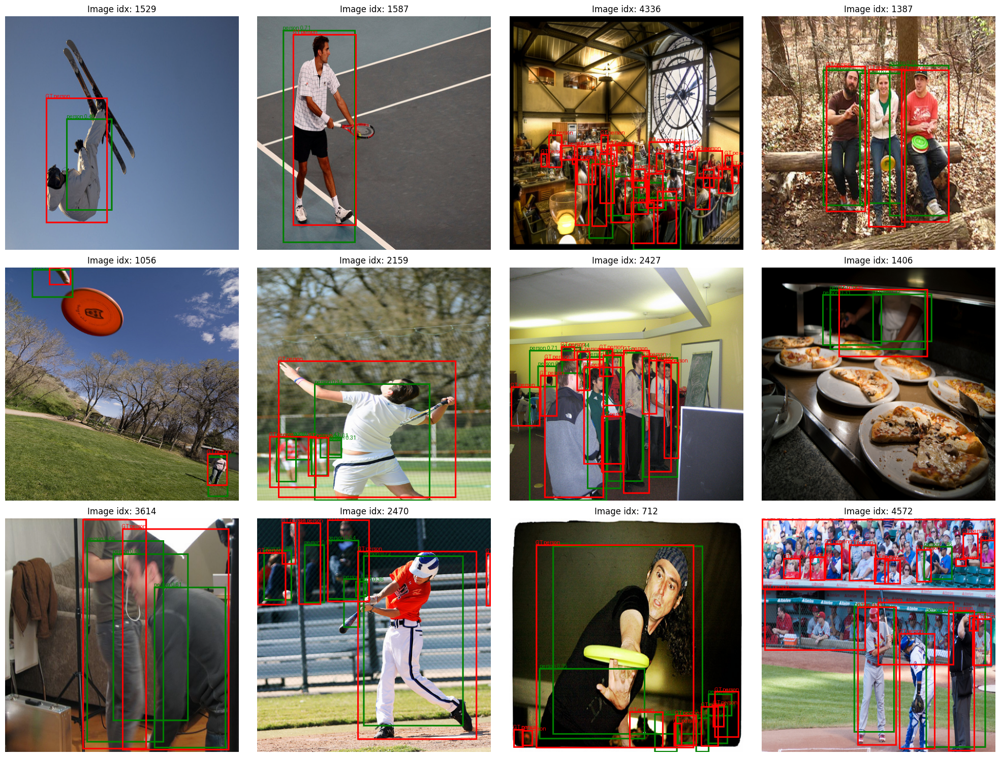

In [86]:
# idx_list = [i for i in rand_images]  # Измените на нужные (e.g., [5, 10, 15])
visualize_multiple( rand_images, val_set, model, DEVICE, threshold=0.3, nms_iou=0.5)  # Threshold ниже для больше boxes

## Вывод 1:

**Модель неплохо справляется с детекцией, где на изображении присутствует объект крупным планом и объектов не так много. Если же объектов много у модели возникают трудности. Если объект большой, то модель находит его в нескольких областях (7х7 в нашей архитектуре) и может разделить их на два разных объекта, хотя объект один. Если два(и более) объектов находятся внутри одного сегмента (7х7 в нашей архитектуре), то модель не может разделить их и определяет как один объект**

### Сохранение статистик

In [87]:
statistic = defaultdict(list)

In [109]:
statistic["best_iou"] = metr["iou"]
statistic["model_name"] = "YOLOV1"
statistic["precision"] = metr["precision"] 
statistic["recall"] = metr["recall"]
statistic["f1_score"] = metr["f1"]

In [88]:
metr

{'iou': 0.33316000936240414,
 'precision': 0.6954944055955566,
 'recall': 0.1300390116961588,
 'f1': 0.2191099565310909,
 'tp': 2300.0,
 'fp': 1007.0,
 'fn': 15387.0,
 'loss': 3.3937210531751063}

In [107]:
df = pd.read_csv("models_metrics.csv")
df

,best_iou,model_name,precision,recall,f1_score
0,0.787718,R-CNN,0.615537,0.500728,0.552228


In [113]:
df = pd.concat([df,pd.DataFrame([statistic])],axis=0)

In [114]:
df

,best_iou,model_name,precision,recall,f1_score
0,0.787718,R-CNN,0.615537,0.500728,0.552228
0,0.333160,YOLOV1,0.695494,0.130039,0.219110


In [115]:
test_set = CocoDataset(test_dir,CLASS_MAP,IMAGE_HEIGHT,transform=val_transform)

In [124]:
test_image_paths = [os.path.join(test_dir, im) for im in test_image_paths]

### Функции для инференса модели без Ground Truth (использование модели)

In [125]:
def draw_boxes(image_tensor, pred_boxes, pred_labels, pred_scores, image_size=448, class_names={1: 'person'}):
    image = image_tensor.permute(1, 2, 0).cpu().numpy()
    image = (image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])) * 255
    image = image.clip(0, 255).astype(np.uint8)
    pil_image = Image.fromarray(image)

    draw = ImageDraw.Draw(pil_image)
    
    for box, label, score in zip(pred_boxes, pred_labels, pred_scores):
        x1, y1, x2, y2 = box.tolist()
        x1, y1, x2, y2 = x1 * image_size, y1 * image_size, x2 * image_size, y2 * image_size
        x1, x2 = min(x1, x2), max(x1, x2)
        y1, y2 = min(y1, y2), max(y1, y2)
        if x2 <= x1 or y2 <= y1:
            continue
        draw.rectangle([x1, y1, x2, y2], outline="green", width=3)
        text = f"{class_names.get(label.item(), 'unknown')} {score:.2f}"
        draw.text((x1, y1 - 10), text, fill="green")
    
    return pil_image

# Основная функция для инференса на списке изображений (без GT)
def inference_and_visualize(model, device, image_paths, transform, num_samples=None, threshold=0.3, nms_iou=0.5, image_size=448):
    model.eval().to(device)
    
    if num_samples is not None and num_samples < len(image_paths):
        image_paths = random.sample(image_paths, num_samples)
    
    num_images = len(image_paths)
    if num_images == 0:
        print("No images provided.")
        return
    
    cols = math.ceil(math.sqrt(num_images))
    rows = math.ceil(num_images / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    axes = axes.flatten() if num_images > 1 else [axes]
    
    for pos, img_path in enumerate(image_paths):
        try:
            # Load image
            original_image = np.array(Image.open(img_path).convert("RGB"))
            
            # Apply transform (resize, normalize)
            transformed = transform(image=original_image)
            image = transformed['image']  # Tensor [3,H,W]
            
            print(f"Processing image: {img_path}")
        except Exception as e:
            print(f"Error loading/processing {img_path}: {e}")
            continue
        
        # Inference
        image_input = image.unsqueeze(0).to(device)
        preds = model(image_input)
        
        # Post-process
        pred_boxes, pred_scores, pred_labels = postprocess_yolo_preds(preds, S=7, B=2, C=1, threshold=threshold, nms_iou=nms_iou)
        
        # Draw (no GT)
        vis_image = draw_boxes(image, pred_boxes, pred_labels, pred_scores, image_size=image_size)
        
        # Show in subplot
        axes[pos].imshow(vis_image)
        axes[pos].set_title(f"Image: {os.path.basename(img_path)}")
        axes[pos].axis('off')
        
        # Save
        save_name = f"inference_{os.path.basename(img_path)}"
        vis_image.save(save_name)
        print(f"Saved to {save_name}")
    
    # Hide empty subplots
    for ax in axes[num_images:]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

In [127]:
test_transform = A.Compose([
    A.Resize(height=IMAGE_HEIGHT, width=IMAGE_WIDTH),
    A.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD,
        max_pixel_value=255.0,
    ),
    ToTensorV2(),
]) 


Processing image: coco_dataset/test2017/img/000000546645.jpg
Sample class_score: 0.7307402491569519
Boxes after filter: 22 (threshold=0.35)
Sample box: [0.0386633425951004, 0.30841881036758423, 0.10041402280330658, 0.4161588251590729]
Saved to inference_000000546645.jpg
Processing image: coco_dataset/test2017/img/000000217764.jpg
Sample class_score: 0.7309929132461548
Boxes after filter: 2 (threshold=0.35)
Sample box: [0.014733806252479553, 0.24755525588989258, 0.21402090787887573, 0.8509929180145264]
Saved to inference_000000217764.jpg
Processing image: coco_dataset/test2017/img/000000262871.jpg
Sample class_score: 0.7310585379600525
Boxes after filter: 1 (threshold=0.35)
Sample box: [0.23126783967018127, 0.33744075894355774, 0.2757713496685028, 0.4722031056880951]
Saved to inference_000000262871.jpg
Processing image: coco_dataset/test2017/img/000000547642.jpg
Sample class_score: 0.7310585379600525
Boxes after filter: 0 (threshold=0.35)
Saved to inference_000000547642.jpg
Processing i

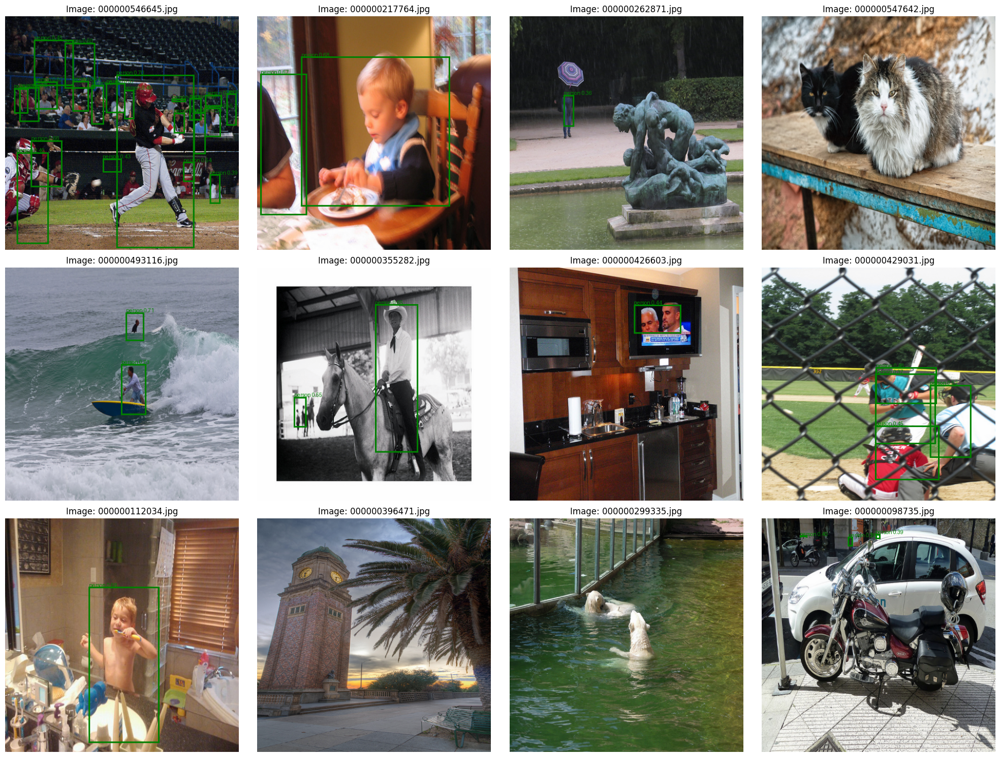

In [131]:
inference_and_visualize(model, DEVICE, test_image_paths, test_transform, num_samples=12, threshold=0.35)  

## Вывод 2:

**Вывод по тестовым изображениям подтверждаем Вывод 1. Модель хорошо справляется с единичными объектами, но путается когда объектов много. Так же модель не может разъединить два объекта и определяет их как один, если объекты рядом друг с другом. Модель галлюцинирует и иногда ей мерещатся маленькие объекты там, где их нет. Можно было и дальше обучать модель. Но не было цели добиться максимальных метрик, а лишь разобраться в архитектуре модели. К тому же уже появились архитектуры быстрее и лучше (YOLOv11). **